# Exp7. 인물사진 만들기

# <목차>
1. 강아지 이미지
2. 사람 이미지
3. 크로마키
4. 문제점 해결
5. 회고

### <각 이미지 내 목차>
1. 이미지 불러오기  
2. 이미지 내 사람 분리하기  
    2-1. 세그멘테이션 모델 생성  
    2-2. 세그멘테이션 모델에 이미지 입력  
    2-3. PASCAL VOC 데이터의 라벨 종류 확인  
    2-4. 모델에서 나온 출력값 확인  
    2-5. output의 색상 확인  
    2-6. seg_color로만 이루어진 마스크 만들기  
    2-7. 원본 이미지와 마스크 합치기  
3. 원본 이미지 배경 흐리게 하기  
4. 흐린 배경과 원본 이미지 합성
5. 문제점 확인

---

# 0. 라이브러리 불러오기

In [1]:
import os
import urllib     # 웹에서 데이터를 다운로드할 때 사용
import cv2        # OpenCV 라이브러리로 이미지를 처리하기 위해 필요
import numpy as np
from pixellib.semantic import semantic_segmentation    # 시맨틱 세그멘테이션을 사용할 수 있는 라이브러리
from matplotlib import pyplot as plt

print('슝')

슝


# 1️⃣ [강아지 이미지]

# 1. 이미지 불러오기

(675, 900, 3)


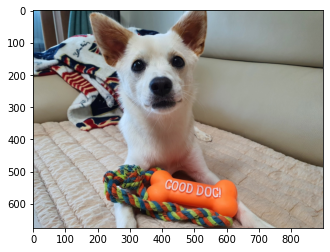

In [2]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_dog.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

# 2. 이미지 내 강아지 분리하기

### 2-0. PixelLib에서 제공해주는 모델 다운로드

In [3]:
# 저장할 파일 이름 결정
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델 URL
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드 시작
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f3adc719520>)

### 2-1. 세그멘테이션 모델 생성

In [4]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

### 2-2. 세그멘테이션 모델에 이미지 입력

In [5]:
# PASCAL VOC 데이터로 학습된 모델을 이용

segvalues, output = model.segmentAsPascalvoc(img_path)

### 2-3. PASCAL VOC 데이터의 라벨 종류 확인

In [6]:
# PASCAL VOC 데이터의 라벨 종류

LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

### 2-4. 모델에서 나온 출력값 확인

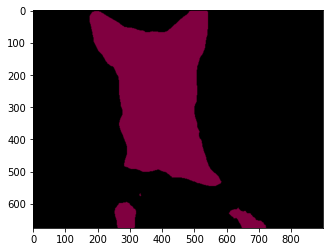

In [7]:
# 모델에서 나온 출력값 (output)

plt.imshow(output)
plt.show()

In [8]:
# 모델에서 나온 출력값 (segvalues)
# 'class_ids': array([0, 12]) : 0 → background, 12 → dog

segvalues

{'class_ids': array([ 0, 12]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [9]:
for class_ids in segvalues['class_ids']:
    print(LABEL_NAMES[class_ids])

background
dog


### 2-5. output의 색상 확인

In [10]:
# 아래 코드 이해하지 않아도 괜찮음 (PixelLib에서 그대로 가져옴)

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [11]:
# 강아지를 나타내는 12번째 색상 확인

colormap[12]

array([ 64,   0, 128])

In [12]:
# output 이미지는 BGR 순서, colormap은 RGB 순서로 채널 배치되므로
# 색상 값의 순서를 바꿔줘야 함

seg_color = (128, 0, 64)

### 2-6. seg_color로만 이루어진 마스크 만들기

(675, 900)


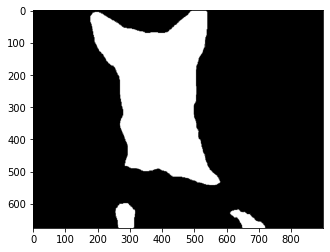

In [13]:
# seg_color로만 이루어진 마스크 만들기
# output의 픽셀 별로 색상이 seg_color와 같으면 1(True), 다르면 0(False)가 됨

seg_map = np.all(output == seg_color, axis = -1)
print(seg_map.shape)

plt.imshow(seg_map, cmap = 'gray')
plt.show()

### 2-7. 원본 이미지와 마스크 합치기

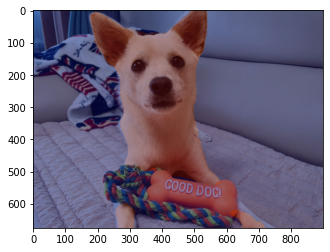

In [14]:
img_show = img_orig.copy()

# True와 False인 값을 각각 255, 0으로 바꿔줌
img_mask = seg_map.astype(np.uint8) * 255   # astype : 데이터프레임 타입 바꾸기

# 255와 0을 적당한 색상으로 바꿈
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스크 합치기
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.3, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

# 3. 원본 이미지 배경 흐리게 하기


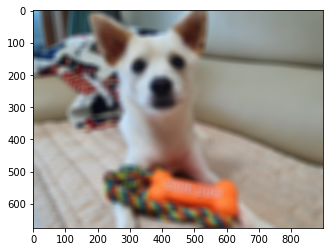

In [15]:
# blur() 함수 사용

img_orig_blur = cv2.blur(img_orig, (20,20))   # (20, 20) → blurring kernel size
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

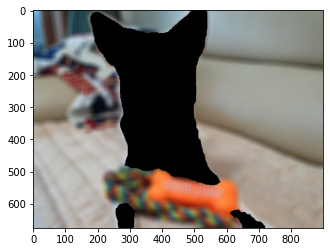

In [16]:
# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)     # bitwise_not : 색이 반대로 됨
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)  # bitwise_and : mask 영역에서 서로 공통으로 겹치는 부분 출력

plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

# 4. 흐린 배경과 원본 이미지 합성

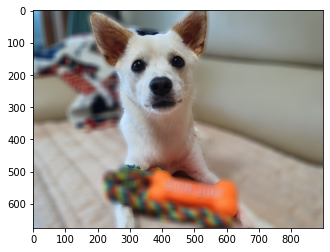

In [17]:
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값 가지고 오기
# 아닌 영역은 블러처리된 이미지 값 사용

img_concat = np.where(img_mask_color == 255, img_orig, img_bg_blur)   # np.where(조건, 참일 때, 거짓일 때)
# img_mask_color가 255인 부분(강아지)은 img_orig 이미지로, 배경은 img_bg_blur 이미지로 합성

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

# 5. 문제점 확인

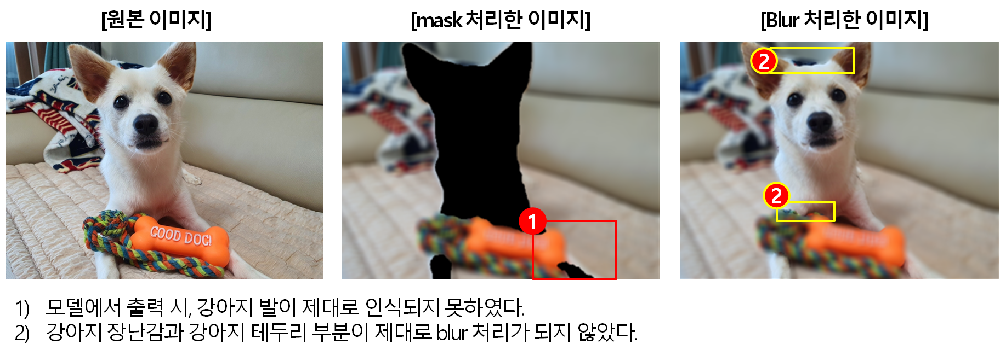

---

# 2️⃣ [사람 이미지_1]

# 1. 이미지 불러오기

(471, 647, 3)


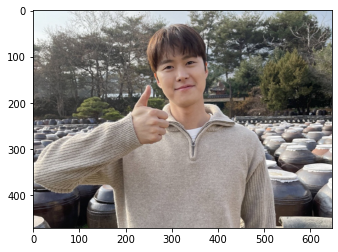

In [18]:
img_path_2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/공명.jpg'  
img_orig_2 = cv2.imread(img_path_2) 

print(img_orig_2.shape)
plt.imshow(cv2.cvtColor(img_orig_2, cv2.COLOR_BGR2RGB))
plt.show()

# 2. 이미지 내 사람 분리하기

### 2-1. 세그멘테이션 모델 생성

In [19]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

### 2-2. 세그멘테이션 모델에 이미지 입력

In [20]:
# PASCAL VOC 데이터로 학습된 모델을 이용

segvalues_2, output_2 = model.segmentAsPascalvoc(img_path_2)

### 2-3. PASCAL VOC 데이터의 라벨 종류 확인

In [21]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

### 2-4. 모델에서 나온 출력값 확인

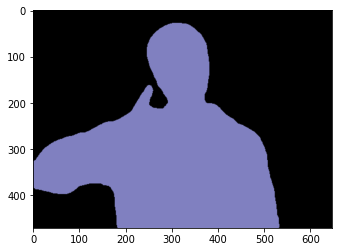

In [22]:
# 모델에서 나온 출력값 (output_2)

plt.imshow(output_2)
plt.show()

In [23]:
# 모델에서 나온 출력값 (segvalues_2)
# 'class_ids': array([0, 15]) : 0 → background, 15 → person

segvalues_2

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [24]:
for class_ids in segvalues_2['class_ids']:
    print(LABEL_NAMES[class_ids])

background
person


### 2-5. output의 색상 확인

In [25]:
# 아래 코드 이해하지 않아도 괜찮음 (PixelLib에서 그대로 가져옴)

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [26]:
# 사람을 나타내는 15번째 색상 확인

colormap[15]

array([192, 128, 128])

In [27]:
# output 이미지는 BGR 순서, colormap은 RGB 순서로 채널 배치되므로
# 색상 값의 순서를 바꿔줘야 함

seg_color = (128, 128, 192)

### 2-6. seg_color로만 이루어진 마스크 만들기

(471, 647)


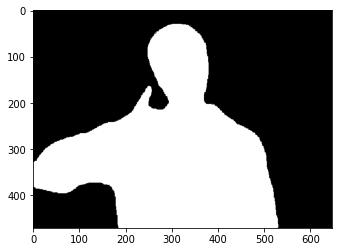

In [28]:
# seg_color로만 이루어진 마스크 만들기
# output의 픽셀 별로 색상이 seg_color와 같으면 1(True), 다르면 0(False)가 됨

seg_map_2 = np.all(output_2 == seg_color, axis = -1)
print(seg_map_2.shape)

plt.imshow(seg_map_2, cmap = 'gray')
plt.show()

### 2-7. 원본 이미지와 마스크 합치기

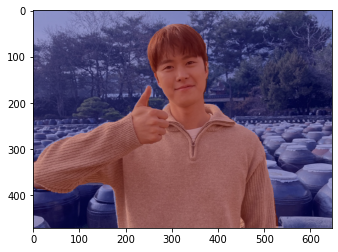

In [29]:
img_show_2 = img_orig_2.copy()

# True와 False인 값을 각각 255, 0으로 바꿔줌
img_mask_2 = seg_map_2.astype(np.uint8) * 255   # astype : 데이터프레임 타입 바꾸기

# 255와 0을 적당한 색상으로 바꿈
color_mask_2 = cv2.applyColorMap(img_mask_2, cv2.COLORMAP_JET)

# 원본 이미지와 마스크 합치기
img_show_2 = cv2.addWeighted(img_show_2, 0.6, color_mask_2, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show_2, cv2.COLOR_BGR2RGB))
plt.show()

# 3. 원본 이미지 배경 흐리게 하기

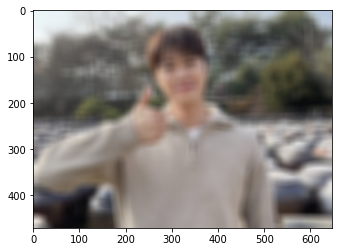

In [30]:
# blur() 함수 사용

img_orig_blur_2 = cv2.blur(img_orig_2, (20,20))   # (20, 20) → blurring kernel size
plt.imshow(cv2.cvtColor(img_orig_blur_2, cv2.COLOR_BGR2RGB))
plt.show()

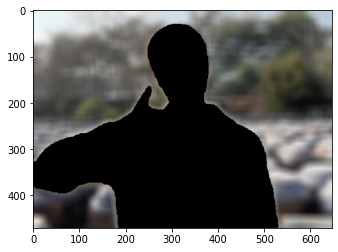

In [31]:
# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

img_mask_color_2 = cv2.cvtColor(img_mask_2, cv2.COLOR_GRAY2BGR)
img_bg_mask_2 = cv2.bitwise_not(img_mask_color_2)     # bitwise_not : 색이 반대로 됨
img_bg_blur_2 = cv2.bitwise_and(img_orig_blur_2, img_bg_mask_2)  # bitwise_and : mask 영역에서 서로 공통으로 겹치는 부분 출력

plt.imshow(cv2.cvtColor(img_bg_blur_2, cv2.COLOR_BGR2RGB))
plt.show()

# 4. 흐린 배경과 원본 이미지 합성

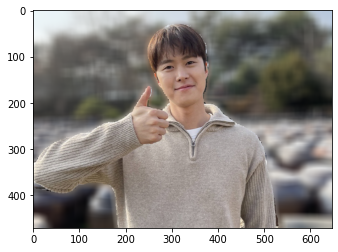

In [32]:
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값 가지고 오기
# 아닌 영역은 블러처리된 이미지 값 사용

img_concat_2 = np.where(img_mask_color_2 == 255, img_orig_2, img_bg_blur_2)   # np.where(조건, 참일 때, 거짓일 때)
# img_mask_color가 255인 부분(사람)은 img_orig 이미지로, 배경은 img_bg_blur 이미지로 합성

plt.imshow(cv2.cvtColor(img_concat_2, cv2.COLOR_BGR2RGB))
plt.show()

# 5. 문제점 확인

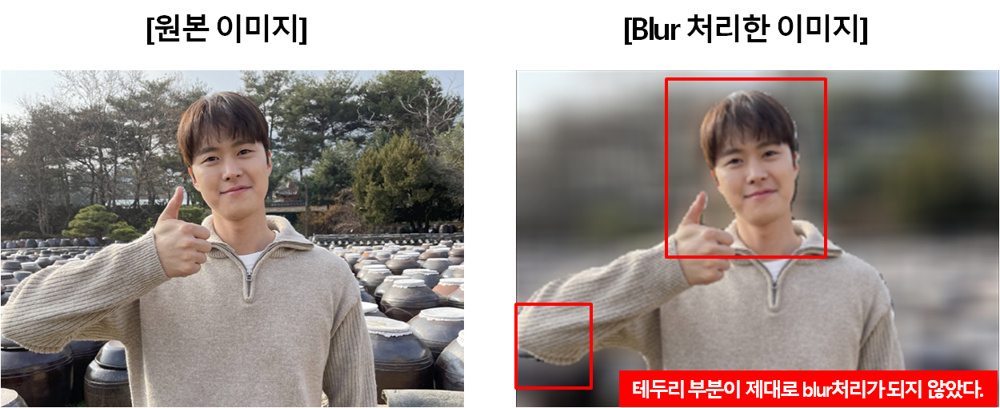

---

# 3️⃣ [사람 이미지_2]

# 1. 이미지 불러오기

(960, 720, 3)


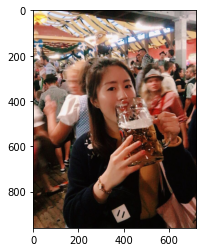

In [33]:
img_path_3 = os.getenv('HOME')+'/aiffel/human_segmentation/images/ramram.jpg'  
img_orig_3 = cv2.imread(img_path_3) 

print(img_orig_3.shape)
plt.imshow(cv2.cvtColor(img_orig_3, cv2.COLOR_BGR2RGB))
plt.show()

# 2. 이미지 내 사람 분리하기

In [34]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

segvalues_3, output_3 = model.segmentAsPascalvoc(img_path_3)

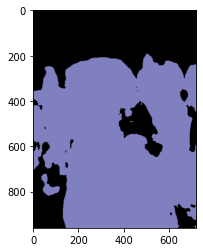

In [35]:
# 모델에서 나온 출력값 (output_3)

plt.imshow(output_3)
plt.show()

In [36]:
# 모델에서 나온 출력값 (segvalues_3)
# 'class_ids': array([0, 15]) : 0 → background, 15 → person

segvalues_3

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True, False],
        [False, False, False, ...,  True,  True, False],
        [False, False, False, ...,  True,  True, False]])}

In [37]:
# 아래 코드 이해하지 않아도 괜찮음 (PixelLib에서 그대로 가져옴)

colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [38]:
# 사람을 나타내는 15번째 색상 확인
colormap[15]

# output 이미지는 BGR 순서, colormap은 RGB 순서로 채널 배치되므로
# 색상 값의 순서를 바꿔줘야 함

seg_color = (128, 128, 192)

(960, 720)


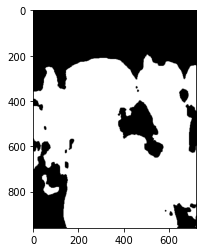

In [39]:
# seg_color로만 이루어진 마스크 만들기
# output의 픽셀 별로 색상이 seg_color와 같으면 1(True), 다르면 0(False)가 됨

seg_map_3 = np.all(output_3 == seg_color, axis = -1)
print(seg_map_3.shape)

plt.imshow(seg_map_3, cmap = 'gray')
plt.show()

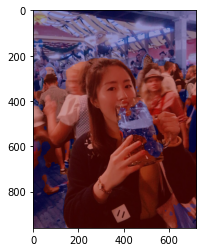

In [40]:
img_show_3 = img_orig_3.copy()

# True와 False인 값을 각각 255, 0으로 바꿔줌
img_mask_3 = seg_map_3.astype(np.uint8) * 255   # astype : 데이터프레임 타입 바꾸기

# 255와 0을 적당한 색상으로 바꿈
color_mask_3 = cv2.applyColorMap(img_mask_3, cv2.COLORMAP_JET)

# 원본 이미지와 마스크 합치기
img_show_3 = cv2.addWeighted(img_show_3, 0.6, color_mask_3, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show_3, cv2.COLOR_BGR2RGB))
plt.show()

# 3. 원본 이미지 배경 흐리게 하기

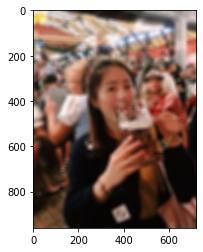

In [41]:
# blur() 함수 사용

img_orig_blur_3 = cv2.blur(img_orig_3, (20,20))   # (20, 20) → blurring kernel size
plt.imshow(cv2.cvtColor(img_orig_blur_3, cv2.COLOR_BGR2RGB))
plt.show()

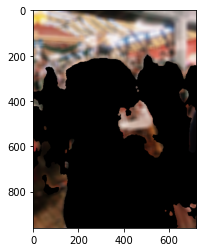

In [42]:
# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

img_mask_color_3 = cv2.cvtColor(img_mask_3, cv2.COLOR_GRAY2BGR)
img_bg_mask_3 = cv2.bitwise_not(img_mask_color_3)     # bitwise_not : 색이 반대로 됨
img_bg_blur_3 = cv2.bitwise_and(img_orig_blur_3, img_bg_mask_3)  # bitwise_and : mask 영역에서 서로 공통으로 겹치는 부분 출력

plt.imshow(cv2.cvtColor(img_bg_blur_3, cv2.COLOR_BGR2RGB))
plt.show()

# 4. 흐린 배경과 원본 이미지 합성

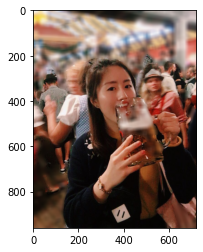

In [43]:
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값 가지고 오기
# 아닌 영역은 블러처리된 이미지 값 사용

img_concat_3 = np.where(img_mask_color_3 == 255, img_orig_3, img_bg_blur_3)   # np.where(조건, 참일 때, 거짓일 때)
# img_mask_color가 255인 부분(사람)은 img_orig 이미지로, 배경은 img_bg_blur 이미지로 합성

plt.imshow(cv2.cvtColor(img_concat_3, cv2.COLOR_BGR2RGB))
plt.show()

# 5. 문제점 확인

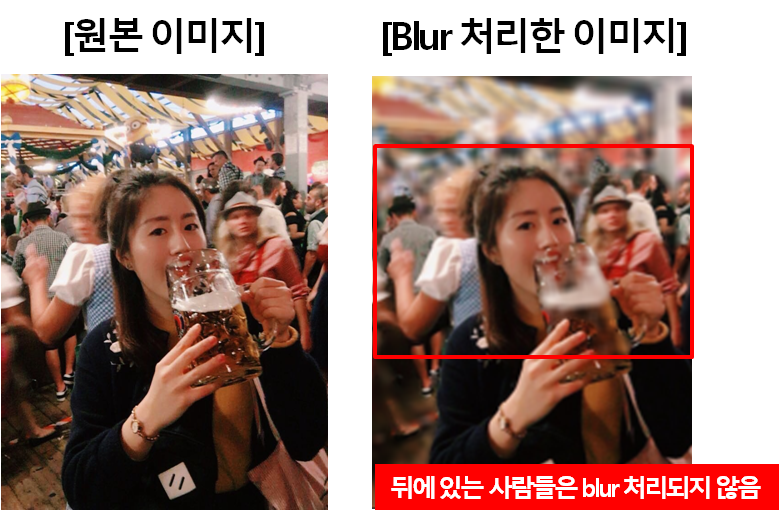

# 4️⃣ [크로마키 해보기]

* 사람 이미지의 사이즈를 배경 이미지의 사이즈로 변경하여 진행하려고 하였으나 아래와 같은 오류가 떴다.  
    → ValueError: operands could not be broadcast together with shapes (471,647,3) (667,1000,3) (667,1000,3) 
* 두 개의 이미지를 동일하게 하는 리사이징 작업을 하였지만 오류가 발생하였다.
* 그래서 배경 이미지를 사람 이미지의 사이즈로 변경하여 진행하였고, 오류는 발생하지 않았다.  

**💡 왜 전자로 진행했을 때 오류가 발생했는지 확인해봐야겠다.**

# 1. 배경 이미지 불러오기

(667, 1000, 3)


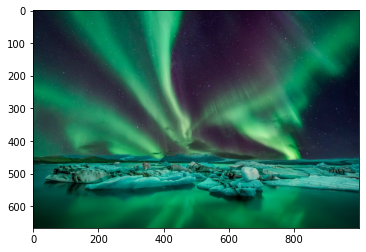

In [44]:
img_path_3 = os.getenv('HOME')+'/aiffel/human_segmentation/images/Iceland_aurora.jpg'  
img_aurora = cv2.imread(img_path_3) 

print(img_aurora.shape)
plt.imshow(cv2.cvtColor(img_aurora, cv2.COLOR_BGR2RGB))
plt.show()

# 2. 배경 이미지와 합성할 이미지 사이즈 맞추기

(471, 647, 3)
(471, 647, 3)


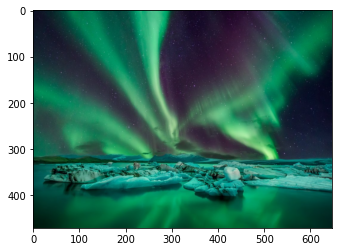

In [45]:
target_size = (img_orig_2.shape[1], img_orig_2.shape[0])
resize_aurora = cv2.resize(img_aurora, target_size)

print(img_orig_2.shape)
print(resize_aurora.shape)

plt.imshow(cv2.cvtColor(resize_aurora, cv2.COLOR_BGR2RGB))
plt.show()

# 3. 합성하기

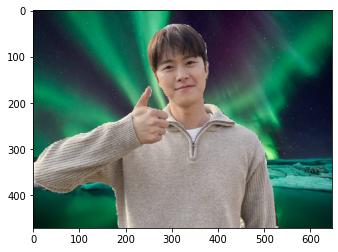

In [46]:
img_concat_3 = np.where(img_mask_color_2==255, img_orig_2, resize_aurora)
plt.imshow(cv2.cvtColor(img_concat_3, cv2.COLOR_BGR2RGB))
plt.show()

# 4. 문제점 확인

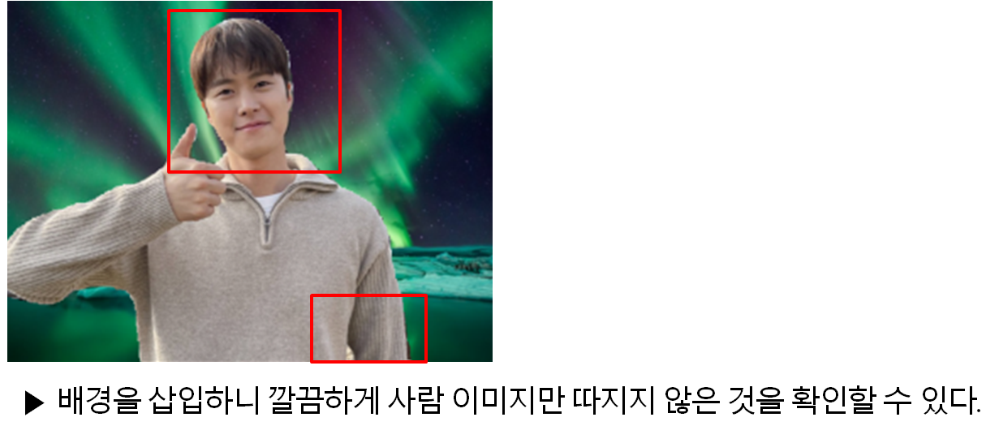

---

# 5️⃣ [문제점 해결]
## 1. 강아지, 사람 이미지
* 깔끔하게 테두리 부분이 blur 처리되지 않은 문제점이 있었다. 
* 배경과 사물 이미지를 분리하는 방법 여러가지를 찾아보았는데, 그 때 **Gaussian blur**의 기법을 알게 되었다.
* 하지만 가우시안 블러를 사용하기 위한 코드를 프로젝트에 적용시키는 것이 어려워 결국 이전 기수의 코드를 참고하였다.
* [참고한 코드](https://nbviewer.org/github/westyeon/EXPLORATION_IC1/blob/master/Exploration08-Semantic_segmentation.ipynb)  

## 1) 강아지 이미지

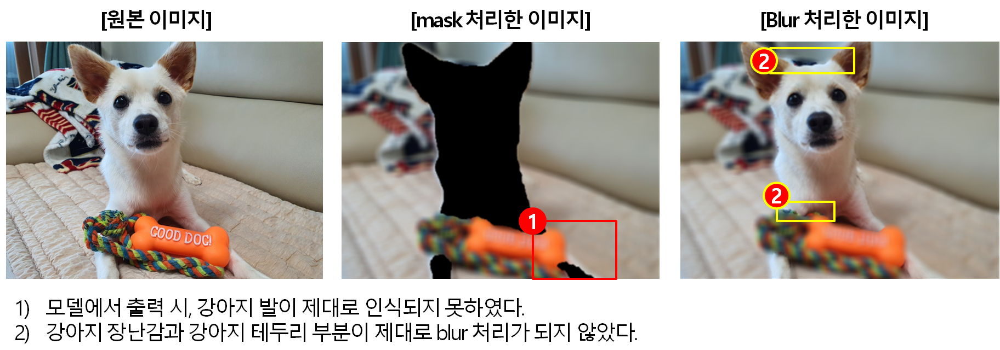

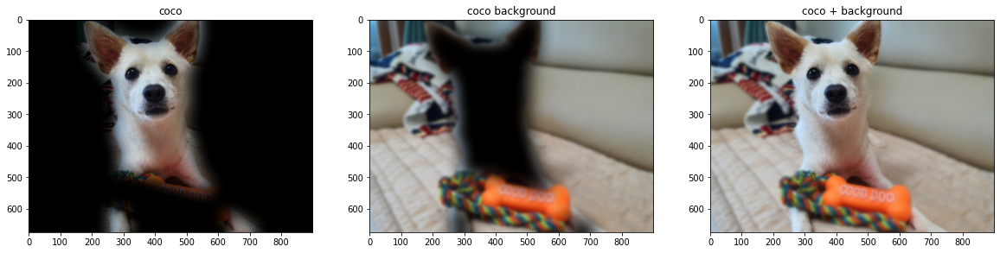

In [47]:
# 원본 사진과 마스크의 크기를 맞춤
img_mask_up = cv2.resize(img_mask, img_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)

# 채널을 원본 사진과 맞게 3 channel로 바꿈
img_mask_3C = np.repeat(np.expand_dims(img_mask_up, axis = 2), 3, axis=2).astype(np.uint8)

# 원본 이미지를 가우시안 Blur 처리
img_orig_gblur = cv2.GaussianBlur(img_orig, (25,25),0)

# 마스크 이미지를 가우시안 Blur 처리
img_mask_gblur = (cv2.GaussianBlur(img_mask_3C, (101, 101), 25, 25)/255).astype(np.float32)

# 마스크와 이미지를 더하기
img_gblur_mask_orig = img_mask_gblur * img_orig.astype(np.float32)

# 1-마스크를 해주는 이유는 Blur 처리한 원본에서 배경만 뽑아내기 위함
img_bg_gmask = (1 - img_mask_gblur) * img_orig_gblur.astype(np.float32)
out_coco = (img_gblur_mask_orig + img_bg_gmask).astype(np.uint8)

fig = plt.figure(figsize=(20, 10)) 

ax = plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img_gblur_mask_orig.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('coco')

ax = plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(img_bg_gmask.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('coco background')

ax = plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(out_coco,cv2.COLOR_BGR2RGB))
ax.set_title('coco + background')

plt.show()

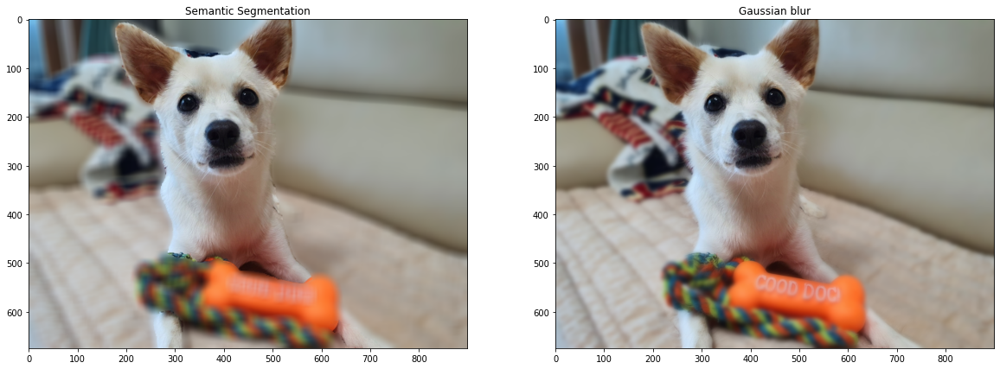

In [48]:
fig = plt.figure(figsize=(20, 10)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
ax.set_title('Semantic Segmentation')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(out_coco,cv2.COLOR_BGR2RGB))
ax.set_title('Gaussian blur')

plt.show()

### 🌞 해결 후
시맨틱 세그멘테이션을 하였을 경우에는 배경과 사물이 명확하게 구분되어 blur 처리가 되었다.  
반면 가우시안 블러를 하였을 경우에는 자연스럽게 배경에 blur처리가 되었다.  
여기에서도 강아지 발이 blur 처리가 되긴 하였지만, 테두리부분이 자연스럽게 되다보니 크게 신경쓰이지는 않았다.

## 2) 사람 이미지

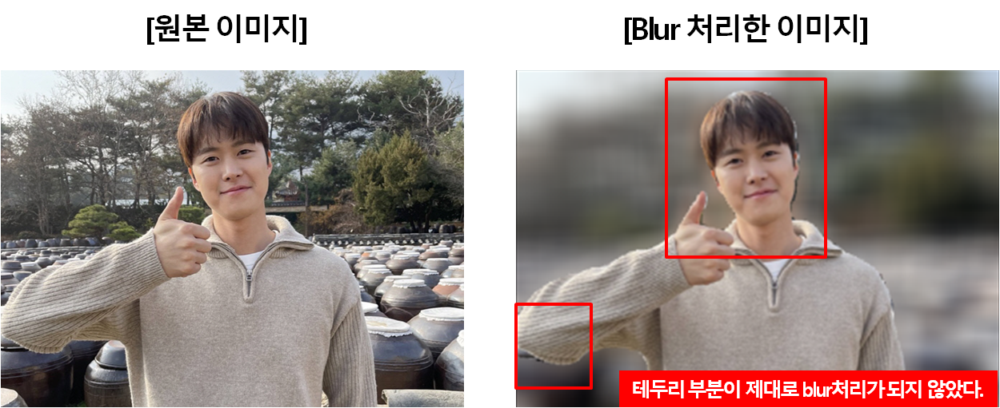

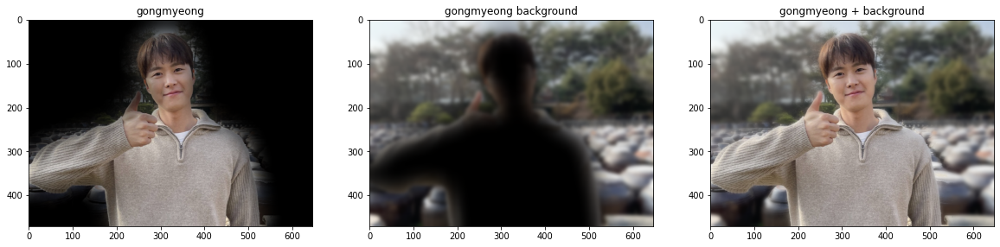

In [49]:
# 원본 사진과 마스크의 크기를 맞춤
img_mask_2_up = cv2.resize(img_mask_2, img_orig_2.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)

# 채널을 원본 사진과 맞게 3 channel로 바꿈
img_mask_2_3C = np.repeat(np.expand_dims(img_mask_2_up, axis = 2), 3, axis=2).astype(np.uint8)

# 원본 이미지를 가우시안 Blur 처리
img_orig_2_gblur = cv2.GaussianBlur(img_orig_2, (25,25),0)

# 마스크 이미지를 가우시안 Blur 처리
img_mask_2_gblur = (cv2.GaussianBlur(img_mask_2_3C, (101, 101), 25, 25)/255).astype(np.float32)

# 마스크와 이미지를 더함
img_2_gblur_mask_orig = img_mask_2_gblur * img_orig_2.astype(np.float32)

# 1-마스크를 해주는 이유는 Blur 처리한 원본에서 배경만 뽑아내기 위함
img_2_bg_gmask = (1 - img_mask_2_gblur) * img_orig_2_gblur.astype(np.float32)
out_gong = (img_2_gblur_mask_orig + img_2_bg_gmask).astype(np.uint8)

fig = plt.figure(figsize=(20, 10)) 

ax = plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img_2_gblur_mask_orig.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('gongmyeong')

ax = plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(img_2_bg_gmask.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('gongmyeong background')

ax = plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(out_gong,cv2.COLOR_BGR2RGB))
ax.set_title('gongmyeong + background')

plt.show()

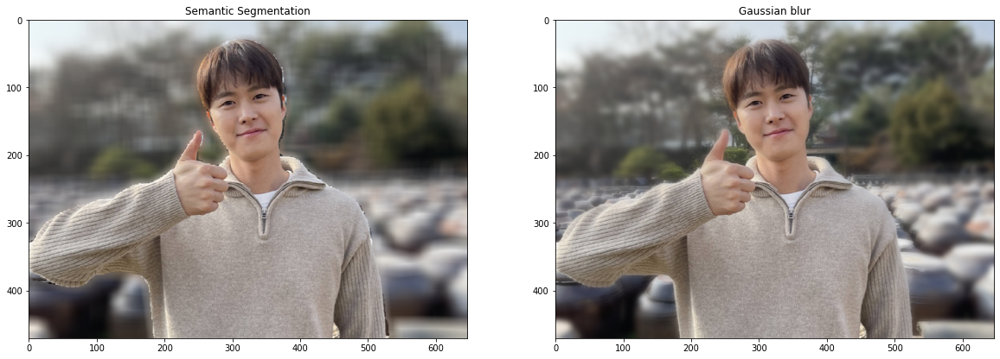

In [50]:
fig = plt.figure(figsize=(20, 10)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_concat_2, cv2.COLOR_BGR2RGB))
ax.set_title('Semantic Segmentation')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(out_gong,cv2.COLOR_BGR2RGB))
ax.set_title('Gaussian blur')

plt.show()

### 🌞 해결 후
사람 이미지도 위의 강아지 이미지와 마찬가지로 테두리 부분이 자연스럽게 blur처리가 되었다.  
그래서 배경과 사람이 따로 노는 느낌을 받지 않았고 자연스러워서 좋았다.

# 2. 여러 명 있는  사람 이미지

* 시맨틱 세그멘테이션은 '사람'으로 인식되는 것들은 모두 같은 라벨로 표현을 한다.
* 그래서 배경에 여러명의 사람이 있는 경우, 사람으로 인식하기에 배경에 있는 사람들 모두 blur 처리가 되지 않는다

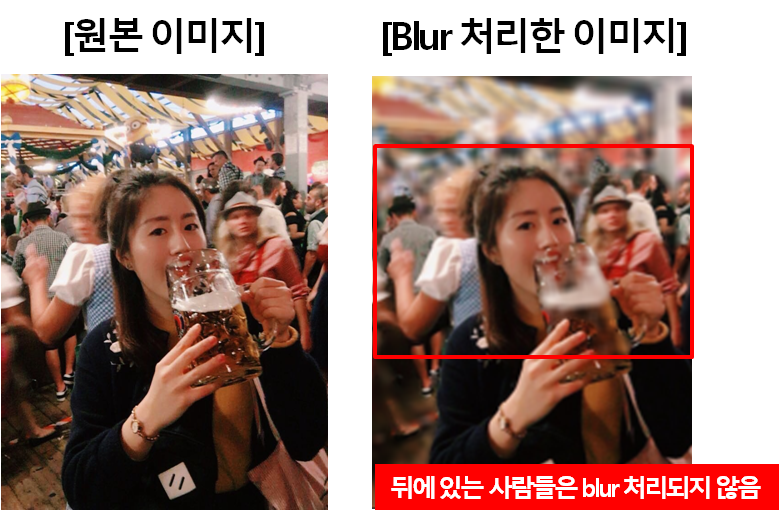

### 인스턴스 세그멘테이션
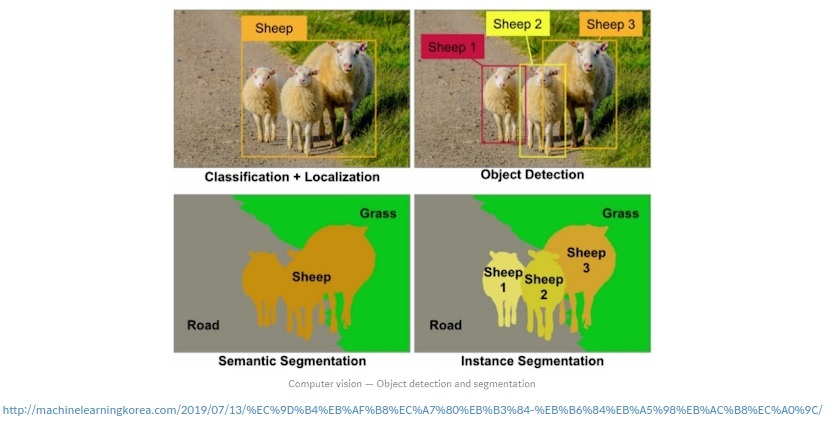
* 하지만 '인스턴스 세그멘테이션'의 경우, 사람을 개개인 별로 다른 라벨로 표현한다.
* 여러 명의 사람이 있는 이미지는 인스턴스 세그멘테이션을 활용해야 할 것 같다.
* 인스턴스 세그멘테이션의 모델은 **'Mask R-CNN'**로, 해당 모델을 사용하면 내가 원하는 한 사람만 분리할 수 있지 않을까 싶다
* [[Instance Segmentation]Mask R-CNN](https://nepersica.tistory.com/9)
* [세그멘테이션 살펴보기](https://ehdgns.tistory.com/119)

# 3. 크로마키

* 크로마키할 때도 테두리에 배경이 완벽하게 제거되지 않았다.
* 위에서 가우시안 블러를 사용하는데, 문득 크로마크도 가우시안 블러를 사용하면 어떨까라는 생각을 하게 되었다.
* 그래서 코드 중에서 가우시안 블러처리된 사람 이미지와 오로라 배경을 가져왔는데, 아래와 같이 사람 이미지가 제대로 나오지 않았다.

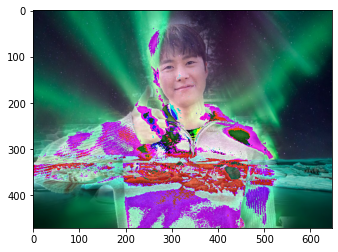

In [51]:
out_gong_2 = (img_2_gblur_mask_orig + resize_aurora).astype(np.uint8)
plt.imshow(cv2.cvtColor(out_gong_2,cv2.COLOR_BGR2RGB))

plt.show()

---

# 6️⃣ 회고

## 1) Semantic Segmentation

* 시멘틱 세그멘테이션으로 셸로우 포커스를 만들어 보았는데, 생각보다 깔끔하지 않아서 너무 아쉬웠다.
* 시멘틱 세그멘테이션 모델로만 문제점을 해결할 수 없을 지 궁금해졌고, 완벽히 극복하지 않더라도 현재 출력된 이미지의 문제점을 조금이나마 해결할 수 있는 방법을 찾고 싶어졌다.

## 2) 문제점 해결
* 문제점을 해결할 수 있는 방안을 이것저것 찾아보다가 발견하였다.
* 가우시안 블러에 대한 여러 코드를 찾았지만, 이것을 프로젝트에 적용하기 어려워 결국 이전 기수의 코드를 참고하였다.
* 가우시안 블러 이외에도 배경을 제거하는 함수가 있어서 봤더니 영상의 배경을 제거하는 예시가 있어 이미지에 어떻게 적용을 해야 할 지 잘 모르겠어서 시도해보지 못했다.
* [BackgroundSubtractorMOG](https://bkshin.tistory.com/entry/OpenCV-30-%EB%B0%B0%EA%B2%BD-%EC%A0%9C%EA%B1%B0Background-Subtraction)
* 크로마키에서도 더 찾아보고 사람 이미지가 제대로 출력되지 않는 원인을 파악해 수정해야겠다.

## 3) Instance Segmentation

* 우연히 배경에 사람이 많은 사진으로 시도했는데, 배경에 있는 사람들이 blur처리가 되지 않았다.
* 배경에 있는 사람들도 blur처리를 하고 싶었는데, LMS에서 나왔던 '인스턴스 세그멘테이션'을 활용하면 된다는 것을 알게 되었다.
* 인스턴스 세그멘테이션의 모델이 어떤 것이 있는지 찾아본 결과, 'Mask R-CNN' 모델이 있었다.
* 하지만 이 모델을 구현하고 싶었으나 하지 못하였다. 어떻게 모델을 구현하면 될 지 더 공부하고 직접 해보고 싶다.

## 4) 추가로 궁금한 점

* 처음에 여러 이미지로 진행해보았는데, 아래의 이미지는 모델에서 나온 출력값에서 이미지가 회전되었다. 그래서 이후의 마스크 만드는 것을 실행하지 못하였다.
* 왜 모델에서 나온 출력값이 회전되어 나오는지 원인을 찾지 못하여 결국 이 문제를 해결하지 못하였다.
* 어떠한 원인인지 나중에라도 찾기 위해 기록해두고자 한다.
* (혹시 이 사진만 그런건가 해서 다른 사진들도 해보았는데, 이렇게 회전하는 사진들이 있었다.)

(4032, 3024, 3)


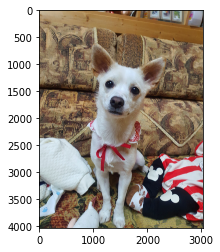

In [52]:
img_path_coco = os.getenv('HOME')+'/aiffel/human_segmentation/images/coco.jpg'  
img_orig_coco = cv2.imread(img_path_coco) 

print(img_orig_coco.shape)
plt.imshow(cv2.cvtColor(img_orig_coco, cv2.COLOR_BGR2RGB))
plt.show()

In [53]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

segvalues_coco, output_coco = model.segmentAsPascalvoc(img_path_coco)

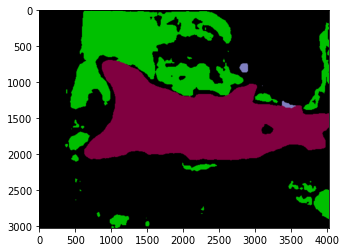

In [54]:
# 모델에서 나온 출력값 (output)

plt.imshow(output_coco)
plt.show()

## 5) 후기
* 다양하게 시도를 하고 싶지만 서칭한 코드를 나의 프로젝트에 적용하는 것은 여전히 어렵다.
* 그래도 시도를 해보려고 하고 있으니 언젠가는 잘 적용할 수 있지 않을까 싶다.
* 하나의 결과를 출력하는 것에서 끝나는 것이 아닌, 출력물에 대한 문제점을 찾고 그에 대한 해결책을 찾는 과정이 힘들긴 했지만 더 기억에 오래 남는 것 같다.
* 성공하지 못한 이미지들이 있는데, 이 이미지들은 관련 내용을 더 공부하고 시도해보고자 한다.